# 07. PyTorch Experiment Tracking Exercise Template

Welcome to the 07. PyTorch Experiment Tracking exercise template notebook.

> **Note:** There may be more than one solution to each of the exercises. This notebook only shows one possible example.

## Resources

1. These exercises/solutions are based on [section 07. PyTorch Transfer Learning](https://www.learnpytorch.io/07_pytorch_experiment_tracking/) of the Learn PyTorch for Deep Learning course by Zero to Mastery.
2. See a live [walkthrough of the solutions (errors and all) on YouTube](https://youtu.be/cO_r2FYcAjU).
3. See [other solutions on the course GitHub](https://github.com/mrdbourke/pytorch-deep-learning/tree/main/extras/solutions).

> **Note:** The first section of this notebook is dedicated to getting various helper functions and datasets used for the exercises. The exercises start at the heading "Exercise 1: ...".

### Get various imports and helper functions

We'll need to make sure we have `torch` v.1.12+ and `torchvision` v0.13+.

In [2]:
 # Make sure we have a GPU
 import torch
 device = "cuda" if torch.cuda.is_available() else "cpu"
 device

'cuda'

In [3]:
# Get regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4393, done.
remote: Counting objects: 100% (1534/1534), done.
remote: Compressing objects: 100% (135/135), done.
remote: Total 4393 (delta 1457), reused 1399 (delta 1399), pack-reused 2859 (from 2)
Receiving objects: 100% (4393/4393), 650.71 MiB | 34.71 MiB/s, done.
Resolving deltas: 100% (2659/2659), done.
Updating files: 100% (248/248), done.


In [4]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

In [5]:
import os
import zipfile

from pathlib import Path

import requests

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:
    """Downloads a zipped dataset from source and unzips to destination.

    Args:
        source (str): A link to a zipped file containing data.
        destination (str): A target directory to unzip data to.
        remove_source (bool): Whether to remove the source after downloading and extracting.

    Returns:
        pathlib.Path to downloaded data.

    Example usage:
        download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                      destination="pizza_steak_sushi")
    """
    # Setup path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    # If the image folder doesn't exist, download it and prepare it...
    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        # Download pizza, steak, sushi data
        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        # Unzip pizza, steak, sushi data
        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        # Remove .zip file
        if remove_source:
            os.remove(data_path / target_file)

    return image_path

image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] Did not find data/pizza_steak_sushi directory, creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip...
[INFO] Unzipping pizza_steak_sushi.zip data...


PosixPath('data/pizza_steak_sushi')

In [6]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None):
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

In [7]:
# Create a test writer
writer = create_writer(experiment_name="test_experiment_name",
                       model_name="this_is_the_model_name",
                       extra="add_a_little_extra_if_you_want")

[INFO] Created SummaryWriter, saving to: runs/2025-07-09/test_experiment_name/this_is_the_model_name/add_a_little_extra_if_you_want...


In [8]:
from typing import Dict, List
from tqdm.auto import tqdm

from going_modular.going_modular.engine import train_step, test_step

# Add writer parameter to train()
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]}
      For example if training for epochs=2:
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
            writer.add_scalars(main_tag="Accuracy",
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc},
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass
    ### End new ###

    # Return the filled results at the end of the epochs
    return results

### Download data

Using the same data from https://www.learnpytorch.io/07_pytorch_experiment_tracking/

In [9]:
# Download 10 percent and 20 percent training data (if necessary)
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data/pizza_steak_sushi directory exists, skipping download.
[INFO] Did not find data/pizza_steak_sushi_20_percent directory, creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip...
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data...


In [10]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
test_dir = data_10_percent_path / "test"

# Check the directories
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_steak_sushi/train
Training directory 20%: data/pizza_steak_sushi_20_percent/train
Testing directory: data/pizza_steak_sushi/test


In [11]:
from torchvision import transforms

# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225])

# Create a transform pipeline
simple_transform = transforms.Compose([
                                       transforms.Resize((224, 224)),
                                       transforms.ToTensor(), # get image values between 0 & 1
                                       normalize
])

### Turn data into DataLoaders

In [12]:
BATCH_SIZE = 32

# Create 10% training and test DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_10_percent,
                                                                                          test_dir=test_dir,
                                                                                          transform=simple_transform,
                                                                                          batch_size=BATCH_SIZE)

# Create 20% training and test DataLoaders
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_20_percent,
                                                                                          test_dir=test_dir,
                                                                                          transform=simple_transform,
                                                                                          batch_size=BATCH_SIZE)

# Find the number of samples/batches per dataloader (using the same test_dataloader for both experiments)
print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(train_dataloader_10_percent)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 10 percent training data: 8
Number of batches of size 32 in 20 percent training data: 15
Number of batches of size 32 in testing data: 8 (all experiments will use the same test set)
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


## Exercise 1: Pick a larger model from [`torchvision.models`](https://pytorch.org/vision/main/models.html) to add to the list of experiments (for example, EffNetB3 or higher)

* How does it perform compared to our existing models?
* **Hint:** You'll need to set up an exerpiment similar to [07. PyTorch Experiment Tracking section 7.6](https://www.learnpytorch.io/07_pytorch_experiment_tracking/#76-create-experiments-and-set-up-training-code).

In [39]:
import torchvision
from torch import nn

# Create an EffNetB2 feature extractor
def create_effnetb2():
  # 1. Get the base model with pretrained weights and send it to the taget device
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  effnetb2_model = torchvision.models.efficientnet_b2(weights=weights).to(device)

  # 2. Freeze the base model
  for param in effnetb2_model.parameters():
    param.requires_grad = False

  # 3. Set the seed()
  set_seeds()

  # 4. Change the classifier head
  effnetb2_model.classifier = nn.Sequential(
      nn.Dropout(p=0.3, inplace=True),
      nn.Linear(in_features=1408,
                out_features=len(class_names),
                bias=True)).to(device)

  # 5. Give the model a name
  effnetb2_model.name = "effnetb2"
  print(f"[INFO] Created {effnetb2_model.name} model.")
  return effnetb2_model

# Creatae an ResNet50 feature extractor
def create_resnet50():
  # 1. Get the base model with pretrained weights and sent it to the target device
  weights = torchvision.models.ResNet50_Weights.DEFAULT
  resnet50_model = torchvision.models.resnet50(weights=weights).to(device)

  # 2. Freeze the base model
  for param in resnet50_model.parameters():
    param.requires_grad = False

  # 3. Set the seed()
  set_seeds()

  # 4. Change the classifier head
  resnet50_model.fc = nn.Linear(in_features=2048,
                                 out_features=len(class_names),
                                 bias=True).to(device)
  # 5. Give the model a name
  resnet50_model.name = "resnet50"
  print(f"[INFO] Created {resnet50_model.name} model.")
  return resnet50_model

In [44]:
# Get a summary of EffNetB2 model
effnetb2=create_effnetb2()
summary(model=create_effnetb2(),
        input_size=(1, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

[INFO] Created effnetb2 model.
[INFO] Created effnetb2 model.


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 224, 224]     [1, 3]               --                   Partial
├─Sequential (features)                                      [1, 3, 224, 224]     [1, 1408, 7, 7]      --                   False
│    └─Conv2dNormActivation (0)                              [1, 3, 224, 224]     [1, 32, 112, 112]    --                   False
│    │    └─Conv2d (0)                                       [1, 3, 224, 224]     [1, 32, 112, 112]    (864)                False
│    │    └─BatchNorm2d (1)                                  [1, 32, 112, 112]    [1, 32, 112, 112]    (64)                 False
│    │    └─SiLU (2)                                         [1, 32, 112, 112]    [1, 32, 112, 112]    --                   --
│    └─Sequential (1)                                        [1, 32, 112, 112]    [1, 1

In [45]:
# Get a summary of ResNet50 model
resnet50=create_resnet50()
summary(model=create_resnet50(),
        input_size=(1, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

[INFO] Created resnet50 model.
[INFO] Created resnet50 model.


Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [1, 3, 224, 224]     [1, 3]               --                   Partial
├─Conv2d (conv1)                         [1, 3, 224, 224]     [1, 64, 112, 112]    (9,408)              False
├─BatchNorm2d (bn1)                      [1, 64, 112, 112]    [1, 64, 112, 112]    (128)                False
├─ReLU (relu)                            [1, 64, 112, 112]    [1, 64, 112, 112]    --                   --
├─MaxPool2d (maxpool)                    [1, 64, 112, 112]    [1, 64, 56, 56]      --                   --
├─Sequential (layer1)                    [1, 64, 56, 56]      [1, 256, 56, 56]     --                   False
│    └─Bottleneck (0)                    [1, 64, 56, 56]      [1, 256, 56, 56]     --                   False
│    │    └─Conv2d (conv1)               [1, 64, 56, 56]      [1, 64, 56, 56]      (4,096)              False
│    │    

Create experiement and setup training code

In [51]:
# 1. Setup number of epochs
num_epochs = [5, 10]
# 2. Create model list
model_list = [effnetb2, resnet50]
# 3. Create dataloader dictionary for various dataloader
train_dataloaders = {"data_10_percent" : train_dataloader_10_percent,
                     "data_20_percent" : train_dataloader_20_percent}

In [60]:
%%time
from going_modular.going_modular.utils import save_model

# 1. Set the random seed
set_seeds(42)

# 2. Keep track of the experiement number
experiement_num = 0
# 2.1 Store all results of each experiement in a list
all_results = []

# 3. Loop through the dataloader
for dataloader_name, train_dataloader in train_dataloaders.items():
  # 4. Loop through each number for epochs
  for epochs in num_epochs:
    # 5. Loop through each model name
    for model in model_list:
      # 6. Create information about print out
      experiement_num += 1
      print(f"[INFO] Experiment number: {experiement_num}")
      print(f"[INFO] Model name: {model.name}")
      print(f"[INFO] DataLoader name: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")
      # 7. Selected the model
      if model.name == "effnetb2":
        model = create_effnetb2()
      elif model.name == "resnet50":
        model = create_resnet50()

      # 8. Create a loss and optimizer
      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

      # 9. Train the target model
      result = train(model=model,
            train_dataloader=train_dataloader,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epochs,
            device=device,
            writer=create_writer(experiment_name=dataloader_name,
                                 model_name=model.name,
                                 extra=f"{epochs}_epochs"))
      # 9.1 Store the results along with the experieemtn parameters
      all_results.append({
          "model_name": model.name,
          "dataloader_name": dataloader_name,
          "epochs": epochs,
          "train_loss": result["train_loss"][-1], # Get the last epoch's loss
          "train_acc": result["train_acc"][-1],   # Get the last epoch's accuracy
          "test_loss": result["test_loss"][-1],   # Get the last epoch's loss
          "test_acc": result["test_acc"][-1]      # Get the last epoch's accuracy
      })
      # 10. Save the model
      save_model(model=model,
                 target_dir="models",
                 model_name=f"{model.name}_{dataloader_name}_{epochs}_epochs.pth")
      print("-"*50+"\n")

[INFO] Experiment number: 1
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_10_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.9241 | train_acc: 0.6406 | test_loss: 0.8659 | test_acc: 0.8144
Epoch: 3 | train_loss: 0.8330 | train_acc: 0.7344 | test_loss: 0.7461 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.7067 | train_acc: 0.8906 | test_loss: 0.7138 | test_acc: 0.8778
Epoch: 5 | train_loss: 0.6750 | train_acc: 0.7891 | test_loss: 0.7052 | test_acc: 0.8873
[INFO] Saving model to: models/effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model name: resnet50
[INFO] DataLoader name: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created resnet50 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_10_percent/resnet50/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0752 | train_acc: 0.3750 | test_loss: 0.9442 | test_acc: 0.8343
Epoch: 2 | train_loss: 0.9098 | train_acc: 0.7188 | test_loss: 0.9200 | test_acc: 0.8144
Epoch: 3 | train_loss: 0.7663 | train_acc: 0.9141 | test_loss: 0.7770 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.7056 | train_acc: 0.7578 | test_loss: 0.7683 | test_acc: 0.9271
Epoch: 5 | train_loss: 0.6200 | train_acc: 0.7891 | test_loss: 0.7990 | test_acc: 0.8864
[INFO] Saving model to: models/resnet50_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_10_percent/effnetb2/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.9241 | train_acc: 0.6406 | test_loss: 0.8659 | test_acc: 0.8144
Epoch: 3 | train_loss: 0.8330 | train_acc: 0.7344 | test_loss: 0.7461 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.7067 | train_acc: 0.8906 | test_loss: 0.7138 | test_acc: 0.8778
Epoch: 5 | train_loss: 0.6750 | train_acc: 0.7891 | test_loss: 0.7052 | test_acc: 0.8873
Epoch: 6 | train_loss: 0.6031 | train_acc: 0.7773 | test_loss: 0.6310 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.5891 | train_acc: 0.8008 | test_loss: 0.6354 | test_acc: 0.8873
Epoch: 8 | train_loss: 0.5280 | train_acc: 0.9336 | test_loss: 0.6177 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.5382 | train_acc: 0.8125 | test_loss: 0.6268 | test_acc: 0.8466
Epoch: 10 | train_loss: 0.4938 | train_acc: 0.9180 | test_loss: 0.5865 | test_acc: 0.8873
[INFO] Saving model to: models/effnetb2_data_10_percent_10_epochs.pth
---------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0752 | train_acc: 0.3750 | test_loss: 0.9442 | test_acc: 0.8343
Epoch: 2 | train_loss: 0.9098 | train_acc: 0.7188 | test_loss: 0.9200 | test_acc: 0.8144
Epoch: 3 | train_loss: 0.7663 | train_acc: 0.9141 | test_loss: 0.7770 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.7056 | train_acc: 0.7578 | test_loss: 0.7683 | test_acc: 0.9271
Epoch: 5 | train_loss: 0.6200 | train_acc: 0.7891 | test_loss: 0.7990 | test_acc: 0.8864
Epoch: 6 | train_loss: 0.5274 | train_acc: 0.9492 | test_loss: 0.6985 | test_acc: 0.9176
Epoch: 7 | train_loss: 0.5210 | train_acc: 0.9492 | test_loss: 0.6485 | test_acc: 0.9167
Epoch: 8 | train_loss: 0.4815 | train_acc: 0.9414 | test_loss: 0.6559 | test_acc: 0.8456
Epoch: 9 | train_loss: 0.4926 | train_acc: 0.8477 | test_loss: 0.6140 | test_acc: 0.8456
Epoch: 10 | train_loss: 0.4049 | train_acc: 0.9688 | test_loss: 0.5363 | test_acc: 0.9176
[INFO] Saving model to: models/resnet50_data_10_percent_10_epochs.pth
---------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7830 | test_acc: 0.8049
Epoch: 2 | train_loss: 0.7384 | train_acc: 0.7646 | test_loss: 0.6643 | test_acc: 0.8769
Epoch: 3 | train_loss: 0.6080 | train_acc: 0.8187 | test_loss: 0.5624 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5470 | train_acc: 0.8479 | test_loss: 0.5689 | test_acc: 0.8570
Epoch: 5 | train_loss: 0.4403 | train_acc: 0.8708 | test_loss: 0.4497 | test_acc: 0.9489
[INFO] Saving model to: models/effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model name: resnet50
[INFO] DataLoader name: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created resnet50 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent/resnet50/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9729 | train_acc: 0.6687 | test_loss: 0.8231 | test_acc: 0.9271
Epoch: 2 | train_loss: 0.6942 | train_acc: 0.9104 | test_loss: 0.6760 | test_acc: 0.8362
Epoch: 3 | train_loss: 0.5796 | train_acc: 0.8688 | test_loss: 0.5860 | test_acc: 0.9271
Epoch: 4 | train_loss: 0.4590 | train_acc: 0.9167 | test_loss: 0.5264 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4181 | train_acc: 0.9042 | test_loss: 0.5148 | test_acc: 0.9375
[INFO] Saving model to: models/resnet50_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent/effnetb2/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7830 | test_acc: 0.8049
Epoch: 2 | train_loss: 0.7384 | train_acc: 0.7646 | test_loss: 0.6643 | test_acc: 0.8769
Epoch: 3 | train_loss: 0.6080 | train_acc: 0.8187 | test_loss: 0.5624 | test_acc: 0.9384
Epoch: 4 | train_loss: 0.5470 | train_acc: 0.8479 | test_loss: 0.5689 | test_acc: 0.8570
Epoch: 5 | train_loss: 0.4403 | train_acc: 0.8708 | test_loss: 0.4497 | test_acc: 0.9489
Epoch: 6 | train_loss: 0.3917 | train_acc: 0.9062 | test_loss: 0.4616 | test_acc: 0.8873
Epoch: 7 | train_loss: 0.3688 | train_acc: 0.9104 | test_loss: 0.4249 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.3850 | train_acc: 0.8938 | test_loss: 0.4438 | test_acc: 0.8674
Epoch: 9 | train_loss: 0.3273 | train_acc: 0.9250 | test_loss: 0.4338 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.3733 | train_acc: 0.8958 | test_loss: 0.3969 | test_acc: 0.9280
[INFO] Saving model to: models/effnetb2_data_20_percent_10_epochs.pth
---------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9729 | train_acc: 0.6687 | test_loss: 0.8231 | test_acc: 0.9271
Epoch: 2 | train_loss: 0.6942 | train_acc: 0.9104 | test_loss: 0.6760 | test_acc: 0.8362
Epoch: 3 | train_loss: 0.5796 | train_acc: 0.8688 | test_loss: 0.5860 | test_acc: 0.9271
Epoch: 4 | train_loss: 0.4590 | train_acc: 0.9167 | test_loss: 0.5264 | test_acc: 0.8968
Epoch: 5 | train_loss: 0.4181 | train_acc: 0.9042 | test_loss: 0.5148 | test_acc: 0.9375
Epoch: 6 | train_loss: 0.3810 | train_acc: 0.9250 | test_loss: 0.4436 | test_acc: 0.8665
Epoch: 7 | train_loss: 0.3421 | train_acc: 0.9208 | test_loss: 0.4201 | test_acc: 0.9072
Epoch: 8 | train_loss: 0.3326 | train_acc: 0.9125 | test_loss: 0.3912 | test_acc: 0.9479
Epoch: 9 | train_loss: 0.3284 | train_acc: 0.9187 | test_loss: 0.3787 | test_acc: 0.8873
Epoch: 10 | train_loss: 0.2897 | train_acc: 0.9313 | test_loss: 0.3610 | test_acc: 0.9176
[INFO] Saving model to: models/resnet50_data_20_percent_10_epochs.pth
---------------------------------------

In [61]:
# Now, filter to find the smallest loss and biggest accuracy
smallest_loss_experiment = min(all_results, key=lambda x: x['test_loss'])
biggest_acc_experiment = max(all_results, key=lambda x: x['test_acc'])

print("Experiment with the smallest test loss:")
print(f"  Model: {smallest_loss_experiment['model_name']}")
print(f"  DataLoader: {smallest_loss_experiment['dataloader_name']}")
print(f"  Epochs: {smallest_loss_experiment['epochs']}")
print(f"  Test Loss: {smallest_loss_experiment['test_loss']:.4f}")

print("\nExperiment with the biggest test accuracy:")
print(f"  Model: {biggest_acc_experiment['model_name']}")
print(f"  DataLoader: {biggest_acc_experiment['dataloader_name']}")
print(f"  Epochs: {biggest_acc_experiment['epochs']}")
print(f"  Test Accuracy: {biggest_acc_experiment['test_acc']:.4f}")

Experiment with the smallest test loss:
  Model: resnet50
  DataLoader: data_20_percent
  Epochs: 10
  Test Loss: 0.3610

Experiment with the biggest test accuracy:
  Model: effnetb2
  DataLoader: data_20_percent
  Epochs: 5
  Test Accuracy: 0.9489


EffNetB2 with 5 epochs have the biggest test acc but resne50 with 10 epochs and 20 percent data have the smallest test loss.

In [62]:
# visualize using tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## Exercise 2. Introduce data augmentation to the list of experiments using the 20% pizza, steak, sushi training and test datasets, does this change anything?
    
* For example, you could have one training DataLoader that uses data augmentation (e.g. `train_dataloader_20_percent_aug` and `train_dataloader_20_percent_no_aug`) and then compare the results of two of the same model types training on these two DataLoaders.
* **Note:** You may need to alter the `create_dataloaders()` function to be able to take a transform for the training data and the testing data (because you don't need to perform data augmentation on the test data). See [04. PyTorch Custom Datasets section 6](https://www.learnpytorch.io/04_pytorch_custom_datasets/#6-other-forms-of-transforms-data-augmentation) for examples of using data augmentation or the script below for an example:

```python
# Note: Data augmentation transform like this should only be performed on training data
train_transform_data_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(),
    transforms.ToTensor(),
    normalize
])

# Create a helper function to visualize different augmented (and not augmented) images
def view_dataloader_images(dataloader, n=10):
    if n > 10:
        print(f"Having n higher than 10 will create messy plots, lowering to 10.")
        n = 10
    imgs, labels = next(iter(dataloader))
    plt.figure(figsize=(16, 8))
    for i in range(n):
        # Min max scale the image for display purposes
        targ_image = imgs[i]
        sample_min, sample_max = targ_image.min(), targ_image.max()
        sample_scaled = (targ_image - sample_min)/(sample_max - sample_min)

        # Plot images with appropriate axes information
        plt.subplot(1, 10, i+1)
        plt.imshow(sample_scaled.permute(1, 2, 0)) # resize for Matplotlib requirements
        plt.title(class_names[labels[i]])
        plt.axis(False)

# Have to update `create_dataloaders()` to handle different augmentations
import os
from torch.utils.data import DataLoader
from torchvision import datasets

NUM_WORKERS = os.cpu_count() # use maximum number of CPUs for workers to load data

# Note: this is an update version of data_setup.create_dataloaders to handle
# differnt train and test transforms.
def create_dataloaders(
    train_dir,
    test_dir,
    train_transform, # add parameter for train transform (transforms on train dataset)
    test_transform,  # add parameter for test transform (transforms on test dataset)
    batch_size=32, num_workers=NUM_WORKERS
):
    # Use ImageFolder to create dataset(s)
    train_data = datasets.ImageFolder(train_dir, transform=train_transform)
    test_data = datasets.ImageFolder(test_dir, transform=test_transform)

    # Get class names
    class_names = train_data.classes

    # Turn images into data loaders
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )
    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )

    return train_dataloader, test_dataloader, class_names
```

# Create data argumentation and non-data argumentation transforms

What we will need:
* 2 different dataloader:
  * A 20% Dataloader with augmenation
  * A 20% DataLoader without augmentation
* Use the biggest acc model (EffNetV2)
* Train for 5 and 10 epochs



In [67]:
# Create data augmentation transforms
from torchvision import transforms
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
train_data_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(),
    transforms.ToTensor(),
    normalize
])
train_data_no_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])

In [73]:
# Alter `create_dataloaders()` to handle different augmenations
import os
from torch.utils.data import DataLoader
from torchvision import datasets

NUM_WORKERS = os.cpu_count() # use maximum number of CPUs for workers to load data

def create_dataloaders(
    train_dir,
    test_dir,
    train_transform, # add parameter for train transform (transforms on train dataset)
    test_transform,  # add parameter for test transform (transforms on test dataset)
    batch_size=32, num_workers=NUM_WORKERS
):
    # Use ImageFolder to create dataset(s)
    train_data = datasets.ImageFolder(train_dir, transform=train_transform)
    test_data = datasets.ImageFolder(test_dir, transform=test_transform)

    # Get class names
    class_names = train_data.classes

    # Turn images into data loaders
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )
    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )

    return train_dataloader, test_dataloader, class_names

In [74]:
# Setup training directory path
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
test_dir_20_percent = data_20_percent_path / "test"

# Check directory
print(f"Training directory of 20%: {train_dir_20_percent}")
print(f"Testing directory of 20%: {test_dir_20_percent}")

Training directory of 20%: data/pizza_steak_sushi_20_percent/train
Testing directory of 20%: data/pizza_steak_sushi_20_percent/test


In [81]:
# Create 20% training and testing Dataloader with augmentation
train_dataloader_20_percent_aug, test_dataloader_20_percent, class_names = create_dataloaders(train_dir=train_dir_20_percent,
                                                                                  test_dir=test_dir_20_percent,
                                                                                  train_transform=train_data_aug,
                                                                                  test_transform=train_data_no_aug,
                                                                                  batch_size=BATCH_SIZE)
# Create 20% training and testing DataLoader without augmentaiton
train_dataloader_20_percent_no_aug, test_dataloader_20_percent, class_names = create_dataloaders(train_dir=train_dir_20_percent,
                                                                                  test_dir=test_dir_20_percent,
                                                                                  train_transform=train_data_no_aug,
                                                                                  test_transform=train_data_no_aug,
                                                                                  batch_size=BATCH_SIZE)


# Check out number of batches on dataloader
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data with augmentation: {len(train_dataloader_20_percent_aug)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data without augmentation: {len(train_dataloader_20_percent_no_aug)}")

Number of batches of size 32 in 20 percent training data with augmentation: 15
Number of batches of size 32 in 20 percent training data without augmentation: 15


In [82]:
# Create an experiement and setup training code
# 1. Create epochs list
num_epochs = [5, 10]
# 2. Create model list
model_list = [effnetb2, resnet50]
# 3.Create dataloader dictionary for with and without augmenation
train_dataloaders = {"data_20_percent_aug" : train_dataloader_20_percent_aug,
                     "data_20_percent_no_aug" : train_dataloader_20_percent_no_aug}

Train model with and without aug

In [84]:
%%time
from going_modular.going_modular.utils import save_model

# 1. Set the random seed
set_seeds(42)
# 2. Keep track of the experiement number
experiement_num = 0
# 2.1 Store all results of each experiement in a list
all_results = []

# 3. Loop throigh the dataloader
for dataloader_name, train_dataloader in train_dataloaders.items():
  # 4. Loop through each number for epochs
  for epochs in num_epochs:
    # 5. Loop through each model name
    for model in model_list:
    # 6. Create infomration about printout
      experiement_num += 1
      print(f"[INFO] Experiment number: {experiement_num}")
      print(f"[INFO] Model name: {model.name}")
      print(f"[INFO] DataLoader name: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")
      # 7. Selected tthe model
      if model.name == "effnetb2":
        model = create_effnetb2()
      elif model.name == "resnet50":
        model = create_resnet50()
      # 8. Creae loss and optimizer
      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
      # 9. Train the target model
      result = train(model=model,
                    train_dataloader=train_dataloader,
                    test_dataloader=test_dataloader_20_percent,
                    optimizer=optimizer,
                    loss_fn=loss_fn,
                    epochs=epochs,
                    device=device,
                    writer=create_writer(experiment_name=dataloader_name,
                                          model_name=model.name,
                                          extra=f"{epochs}_epochs"))
      # 9.1 store all the results
      all_results.append({
          "model_name": model.name,
          "dataloader_name": dataloader_name,
          "epochs": epochs,
          "train_loss": result["train_loss"][-1], # Get the last epoch's loss
          "train_acc": result["train_acc"][-1],
          "test_loss": result["test_loss"][-1],
          "test_acc": result["test_acc"][-1]
      })
      # 10. Save the model
      save_model(model=model,
                target_dir="models",
                model_name=f"{model.name}_{dataloader_name}_{epochs}_epochs.pth")
      print("-"*50+"\n")

[INFO] Experiment number: 1
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_20_percent_aug
[INFO] Number of epochs: 5
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent_aug/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9958 | train_acc: 0.5208 | test_loss: 0.7503 | test_acc: 0.8506
Epoch: 2 | train_loss: 0.7763 | train_acc: 0.7333 | test_loss: 0.6107 | test_acc: 0.9006
Epoch: 3 | train_loss: 0.6175 | train_acc: 0.8125 | test_loss: 0.5241 | test_acc: 0.8943
Epoch: 4 | train_loss: 0.5532 | train_acc: 0.8438 | test_loss: 0.4671 | test_acc: 0.9159
Epoch: 5 | train_loss: 0.5307 | train_acc: 0.8417 | test_loss: 0.4099 | test_acc: 0.9131
[INFO] Saving model to: models/effnetb2_data_20_percent_aug_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model name: resnet50
[INFO] DataLoader name: data_20_percent_aug
[INFO] Number of epochs: 5
[INFO] Created resnet50 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent_aug/resnet50/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9895 | train_acc: 0.6333 | test_loss: 0.7901 | test_acc: 0.8915
Epoch: 2 | train_loss: 0.7601 | train_acc: 0.8208 | test_loss: 0.6536 | test_acc: 0.8665
Epoch: 3 | train_loss: 0.6047 | train_acc: 0.9000 | test_loss: 0.5652 | test_acc: 0.9159
Epoch: 4 | train_loss: 0.5346 | train_acc: 0.8583 | test_loss: 0.4957 | test_acc: 0.9222
Epoch: 5 | train_loss: 0.5284 | train_acc: 0.8667 | test_loss: 0.4349 | test_acc: 0.9284
[INFO] Saving model to: models/resnet50_data_20_percent_aug_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_20_percent_aug
[INFO] Number of epochs: 10
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent_aug/effnetb2/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9958 | train_acc: 0.5208 | test_loss: 0.7503 | test_acc: 0.8506
Epoch: 2 | train_loss: 0.7763 | train_acc: 0.7333 | test_loss: 0.6107 | test_acc: 0.9006
Epoch: 3 | train_loss: 0.6175 | train_acc: 0.8125 | test_loss: 0.5241 | test_acc: 0.8943
Epoch: 4 | train_loss: 0.5532 | train_acc: 0.8438 | test_loss: 0.4671 | test_acc: 0.9159
Epoch: 5 | train_loss: 0.5307 | train_acc: 0.8417 | test_loss: 0.4099 | test_acc: 0.9131
Epoch: 6 | train_loss: 0.4647 | train_acc: 0.8625 | test_loss: 0.3895 | test_acc: 0.9290
Epoch: 7 | train_loss: 0.4321 | train_acc: 0.9000 | test_loss: 0.3668 | test_acc: 0.9187
Epoch: 8 | train_loss: 0.4090 | train_acc: 0.8958 | test_loss: 0.3388 | test_acc: 0.9437
Epoch: 9 | train_loss: 0.4252 | train_acc: 0.8729 | test_loss: 0.3280 | test_acc: 0.9313
Epoch: 10 | train_loss: 0.4258 | train_acc: 0.8333 | test_loss: 0.3147 | test_acc: 0.9375
[INFO] Saving model to: models/effnetb2_data_20_percent_aug_10_epochs.pth
-----------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9895 | train_acc: 0.6333 | test_loss: 0.7901 | test_acc: 0.8915
Epoch: 2 | train_loss: 0.7601 | train_acc: 0.8208 | test_loss: 0.6536 | test_acc: 0.8665
Epoch: 3 | train_loss: 0.6047 | train_acc: 0.9000 | test_loss: 0.5652 | test_acc: 0.9159
Epoch: 4 | train_loss: 0.5346 | train_acc: 0.8583 | test_loss: 0.4957 | test_acc: 0.9222
Epoch: 5 | train_loss: 0.5284 | train_acc: 0.8667 | test_loss: 0.4349 | test_acc: 0.9284
Epoch: 6 | train_loss: 0.4312 | train_acc: 0.9104 | test_loss: 0.4025 | test_acc: 0.9256
Epoch: 7 | train_loss: 0.4214 | train_acc: 0.8854 | test_loss: 0.3627 | test_acc: 0.9534
Epoch: 8 | train_loss: 0.4285 | train_acc: 0.8708 | test_loss: 0.3378 | test_acc: 0.9443
Epoch: 9 | train_loss: 0.3827 | train_acc: 0.8833 | test_loss: 0.3633 | test_acc: 0.9318
Epoch: 10 | train_loss: 0.3700 | train_acc: 0.9042 | test_loss: 0.3003 | test_acc: 0.9437
[INFO] Saving model to: models/resnet50_data_20_percent_aug_10_epochs.pth
-----------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7456 | test_acc: 0.8847
Epoch: 2 | train_loss: 0.7320 | train_acc: 0.8125 | test_loss: 0.6200 | test_acc: 0.8943
Epoch: 3 | train_loss: 0.6098 | train_acc: 0.8438 | test_loss: 0.5399 | test_acc: 0.8943
Epoch: 4 | train_loss: 0.4794 | train_acc: 0.9146 | test_loss: 0.4803 | test_acc: 0.9034
Epoch: 5 | train_loss: 0.4950 | train_acc: 0.8417 | test_loss: 0.4363 | test_acc: 0.8943
[INFO] Saving model to: models/effnetb2_data_20_percent_no_aug_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model name: resnet50
[INFO] DataLoader name: data_20_percent_no_aug
[INFO] Number of epochs: 5
[INFO] Created resnet50 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent_no_aug/resnet50/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9729 | train_acc: 0.6687 | test_loss: 0.8035 | test_acc: 0.8852
Epoch: 2 | train_loss: 0.6936 | train_acc: 0.8562 | test_loss: 0.6631 | test_acc: 0.8727
Epoch: 3 | train_loss: 0.5421 | train_acc: 0.9062 | test_loss: 0.5281 | test_acc: 0.9159
Epoch: 4 | train_loss: 0.4749 | train_acc: 0.8979 | test_loss: 0.5240 | test_acc: 0.9563
Epoch: 5 | train_loss: 0.4435 | train_acc: 0.8917 | test_loss: 0.4708 | test_acc: 0.9472
[INFO] Saving model to: models/resnet50_data_20_percent_no_aug_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model name: effnetb2
[INFO] DataLoader name: data_20_percent_no_aug
[INFO] Number of epochs: 10
[INFO] Created effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2025-07-09/data_20_percent_no_aug/effnetb2/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9896 | train_acc: 0.5208 | test_loss: 0.7456 | test_acc: 0.8847
Epoch: 2 | train_loss: 0.7320 | train_acc: 0.8125 | test_loss: 0.6200 | test_acc: 0.8943
Epoch: 3 | train_loss: 0.6098 | train_acc: 0.8438 | test_loss: 0.5399 | test_acc: 0.8943
Epoch: 4 | train_loss: 0.4794 | train_acc: 0.9146 | test_loss: 0.4803 | test_acc: 0.9034
Epoch: 5 | train_loss: 0.4950 | train_acc: 0.8417 | test_loss: 0.4363 | test_acc: 0.8943
Epoch: 6 | train_loss: 0.4099 | train_acc: 0.9021 | test_loss: 0.4306 | test_acc: 0.9040
Epoch: 7 | train_loss: 0.3632 | train_acc: 0.9396 | test_loss: 0.3896 | test_acc: 0.8972
Epoch: 8 | train_loss: 0.3274 | train_acc: 0.9437 | test_loss: 0.3524 | test_acc: 0.9313
Epoch: 9 | train_loss: 0.3497 | train_acc: 0.9062 | test_loss: 0.3445 | test_acc: 0.9034
Epoch: 10 | train_loss: 0.3624 | train_acc: 0.8896 | test_loss: 0.3332 | test_acc: 0.9062
[INFO] Saving model to: models/effnetb2_data_20_percent_no_aug_10_epochs.pth
--------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9729 | train_acc: 0.6687 | test_loss: 0.8035 | test_acc: 0.8852
Epoch: 2 | train_loss: 0.6936 | train_acc: 0.8562 | test_loss: 0.6631 | test_acc: 0.8727
Epoch: 3 | train_loss: 0.5421 | train_acc: 0.9062 | test_loss: 0.5281 | test_acc: 0.9159
Epoch: 4 | train_loss: 0.4749 | train_acc: 0.8979 | test_loss: 0.5240 | test_acc: 0.9563
Epoch: 5 | train_loss: 0.4435 | train_acc: 0.8917 | test_loss: 0.4708 | test_acc: 0.9472
Epoch: 6 | train_loss: 0.3667 | train_acc: 0.9354 | test_loss: 0.4186 | test_acc: 0.9381
Epoch: 7 | train_loss: 0.3682 | train_acc: 0.9187 | test_loss: 0.3708 | test_acc: 0.9534
Epoch: 8 | train_loss: 0.3343 | train_acc: 0.9187 | test_loss: 0.3488 | test_acc: 0.9631
Epoch: 9 | train_loss: 0.3176 | train_acc: 0.9146 | test_loss: 0.3468 | test_acc: 0.9284
Epoch: 10 | train_loss: 0.3066 | train_acc: 0.9271 | test_loss: 0.3043 | test_acc: 0.9625
[INFO] Saving model to: models/resnet50_data_20_percent_no_aug_10_epochs.pth
--------------------------------

In [85]:
# Now, filter to find the smallest loss and biggest accuracy
smallest_loss_experiment = min(all_results, key=lambda x: x['test_loss'])
biggest_acc_experiment = max(all_results, key=lambda x: x['test_acc'])

print("Experiment with the smallest test loss:")
print(f"  Model: {smallest_loss_experiment['model_name']}")
print(f"  DataLoader: {smallest_loss_experiment['dataloader_name']}")
print(f"  Epochs: {smallest_loss_experiment['epochs']}")
print(f"  Test Loss: {smallest_loss_experiment['test_loss']:.4f}")

print("\nExperiment with the biggest test accuracy:")
print(f"  Model: {biggest_acc_experiment['model_name']}")
print(f"  DataLoader: {biggest_acc_experiment['dataloader_name']}")
print(f"  Epochs: {biggest_acc_experiment['epochs']}")
print(f"  Test Accuracy: {biggest_acc_experiment['test_acc']:.4f}")

Experiment with the smallest test loss:
  Model: resnet50
  DataLoader: data_20_percent_aug
  Epochs: 10
  Test Loss: 0.3003

Experiment with the biggest test accuracy:
  Model: resnet50
  DataLoader: data_20_percent_no_aug
  Epochs: 10
  Test Accuracy: 0.9625


In [86]:
# Setup the best model filepath
best_model_path_aug = "models/resnet50_data_20_percent_aug_10_epochs.pth"
best_model_path_no_aug = "models/resnet50_data_20_percent_no_aug_10_epochs.pth"
# Load the best model
best_model = create_resnet50()
# Load in the state dict of the best model
best_model.load_state_dict(torch.load(best_model_path_aug))
best_model.load_state_dict(torch.load(best_model_path_no_aug))

[INFO] Created resnet50 model.


<All keys matched successfully>

In [90]:
from pathlib import Path
resnet50_model_aug_size = Path(best_model_path_aug).stat().st_size // (1024 * 1024)
resnet50_model_no_aug_size = Path(best_model_path_no_aug).stat().st_size // (1024 * 1024)
print(F"ResNet50 model size with augmentation: {resnet50_model_aug_size:.3f} MB")
print(F"ResNet50 model size without augmentation: {resnet50_model_no_aug_size:.3f} MB")

ResNet50 model size with augmentation: 90.000 MB
ResNet50 model size without augmentation: 90.000 MB


In [91]:
# plot and predict
from going_modular.going_modular.predictions import pred_and_plot_image

import random
num_images = 5
test_images_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg"))
random_image_paths = random.sample(test_images_path_list, num_images)

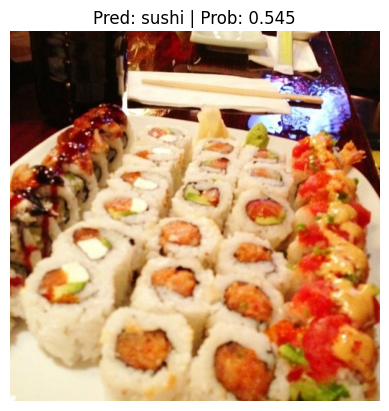

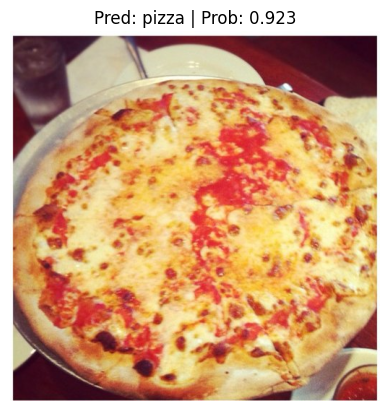

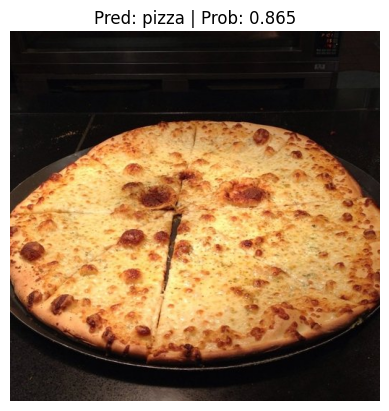

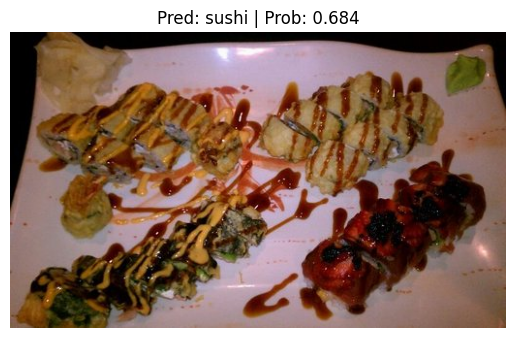

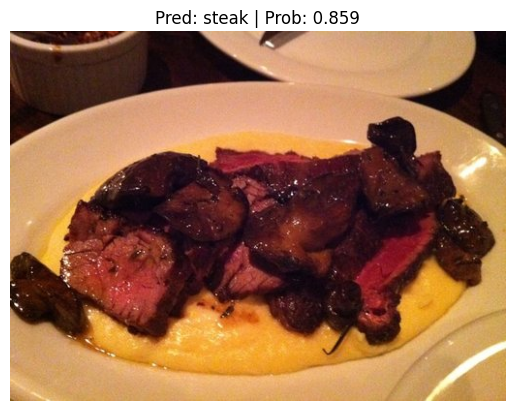

In [95]:
# With augmentation
for image_path in random_image_paths:
  pred_and_plot_image(model=best_model,
                      image_path=image_path,
                      class_names=class_names,
                      image_size=(224, 224),
                      transform=train_data_aug,
                      device=device)

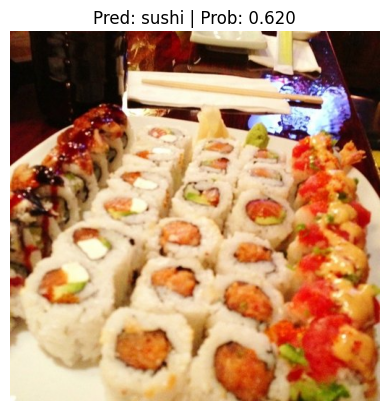

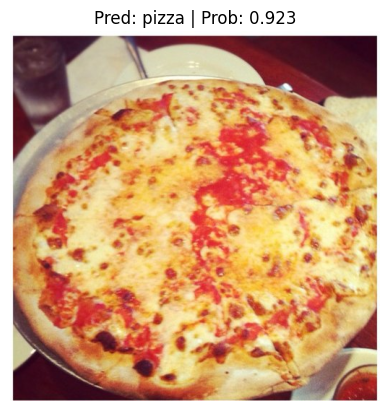

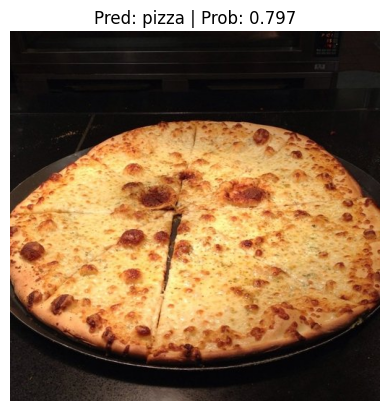

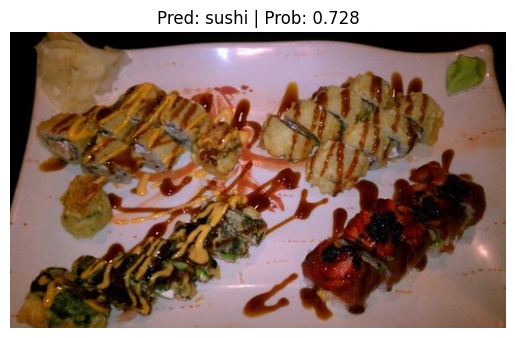

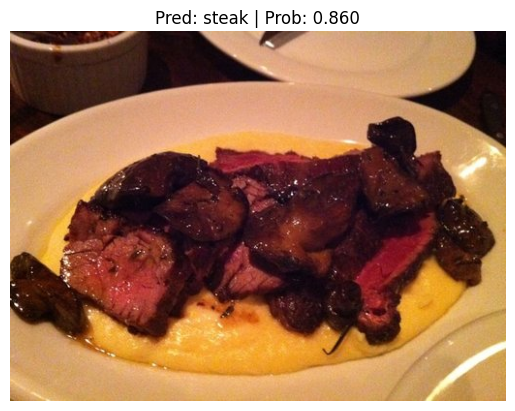

In [94]:
# without augmentatio
for image_path in random_image_paths:
  pred_and_plot_image(model=best_model,
                      image_path=image_path,
                      class_names=class_names,
                      image_size=(224, 224),
                      transform=train_data_no_aug,
                      device=device)

## Exercise 3. Scale up the dataset to turn FoodVision Mini into FoodVision Big using the entire [Food101 dataset from `torchvision.models`](https://pytorch.org/vision/stable/generated/torchvision.datasets.Food101.html#torchvision.datasets.Food101)
    
* You could take the best performing model from your various experiments or even the EffNetB2 feature extractor we created in this notebook and see how it goes fitting for 5 epochs on all of Food101.
* If you try more than one model, it would be good to have the model's results tracked.
* If you load the Food101 dataset from `torchvision.models`, you'll have to create PyTorch DataLoaders to use it in training.
* **Note:** Due to the larger amount of data in Food101 compared to our pizza, steak, sushi dataset, this model will take longer to train.

In [ ]:
# TODO: your code